# Hybrid Vision Transformer (ViT)

![ViT](media/vision_transformer/hybrid_vit.png "Hybrid ViT")

In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [2]:
from utils.transformer import TransformerEncoder, PatchClassEmbedding, Patches
from tensorflow.keras.applications.efficientnet import preprocess_input
from utils.visualize import plotHistory, plot_misclassified_images
from utils.tools import CustomSchedule
import tensorflow as tf
import tensorflow_datasets as tfds
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import cv2
from tqdm.notebook import tqdm
from sklearn.model_selection import train_test_split

In [3]:
# set some paths
model_dir = Path('bin')

In [4]:
gpus = tf.config.experimental.list_physical_devices('GPU')
tf.config.experimental.set_visible_devices(gpus[0], 'GPU')
tf.config.experimental.set_memory_growth(gpus[0], True)

# 1.0 Import the Dataset

## 1.1 Download a dataset (Cats_vs_Dogs)

In [5]:
ds_train, ds_info = tfds.load(
    'cats_vs_dogs',
    shuffle_files=True,
    as_supervised=True,
    with_info=True)

In [6]:
ds_info

tfds.core.DatasetInfo(
    name='cats_vs_dogs',
    full_name='cats_vs_dogs/4.0.0',
    description="""
    A large set of images of cats and dogs. There are 1738 corrupted images that are dropped.
    """,
    homepage='https://www.microsoft.com/en-us/download/details.aspx?id=54765',
    data_path='/home/vitto/tensorflow_datasets/cats_vs_dogs/4.0.0',
    download_size=786.68 MiB,
    dataset_size=689.64 MiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=tf.uint8),
        'image/filename': Text(shape=(), dtype=tf.string),
        'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=2),
    }),
    supervised_keys=('image', 'label'),
    splits={
        'train': <SplitInfo num_examples=23262, num_shards=8>,
    },
    citation="""@Inproceedings (Conference){asirra-a-captcha-that-exploits-interest-aligned-manual-image-categorization,
    author = {Elson, Jeremy and Douceur, John (JD) and Howell, Jon and Saul, Jared},
    title = {Asirra: A CAPTCHA

In [7]:
label_names = ds_info.features['label'].names
print(label_names)

['cat', 'dog']


In [8]:
n_images = ds_info.splits['train'].num_examples
print(n_images)

23262


# 2.0 Prepare the Dataset

In [9]:
# dataset configurations
input_size = (224, 224, 3)
test_size = 0.2

In [10]:
def build_dataset(ds, n_images):
    """Create a numpy array resizing all images"""
    X = np.empty((n_images, input_size[0], input_size[1], input_size[2]), dtype="float32")
    y = np.empty((n_images), dtype="float32")
    for i, data in tqdm(enumerate(ds['train'])):
        img = cv2.resize(data[0].numpy(), (input_size[1],input_size[0]))
        X[i] = img
        y[i] = data[1]
    return X, y

In [11]:
X, y = build_dataset(ds_train, n_images)

0it [00:00, ?it/s]

## 2.1 Split the dataset

In [12]:
# split with a stratified sampling
(X_train, X_test, y_train, y_test) = train_test_split(X, y,
    test_size=test_size, stratify=y, random_state=42)

## 2.2 Build a pre-process pipeline with keras pre

In [13]:
pre_process_pipeline = tf.keras.Sequential([
        tf.keras.layers.Lambda(lambda x: preprocess_input(x)),
        tf.keras.layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
        tf.keras.layers.experimental.preprocessing.RandomContrast(0.4),
        tf.keras.layers.experimental.preprocessing.RandomRotation(factor=0.1)])

# 3.0 Build the Hybrid Vision Transformer (ViT)

## 3.1 Backbone

In [14]:
backbone = tf.keras.applications.EfficientNetB3(input_shape=(224,224,3), include_top=False) 

In [15]:
backbone.summary()

Model: "efficientnetb3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
rescaling (Rescaling)           (None, 224, 224, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
normalization (Normalization)   (None, 224, 224, 3)  7           rescaling[0][0]                  
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (None, 225, 225, 3)  0           normalization[0][0]              
_____________________________________________________________________________________

In [16]:
for layer in backbone.layers:
    layer.trainable = False

## 3.2 Build the model

In [17]:
# model configurations
d_model = 128
d_ff = d_model * 2
n_heads = 8
mlp_head_size = 256
dropout = 0.1
activation = 'relu'
n_layers = 2
patch_size = 1

In [18]:
def build_vit(backbone, transformer):
    # Input
    inputs = tf.keras.layers.Input(shape=input_size)
    
    # Data pre_processing Pipeline
    x = pre_process_pipeline(inputs)
    
    # Feed Backbne
    x = backbone(x)
    
    backbone_shape = x.shape
    
    # Patch Creation
    x = Patches(patch_size)(x)   
    
    # Linear Projection of Flattened Patches
    x = tf.keras.layers.Dense(d_model)(x)
    
    # Position Embedding + Extra learnable class embedding
    n_patches = (backbone_shape[1]//patch_size)**2
    x = PatchClassEmbedding(d_model, n_patches)(x)
    
    # Transformer Model
    x = transformer(x)
    
    # Take only the Extra Learnable Class
    x = tf.keras.layers.Lambda(lambda x: x[:,0,:])(x)
    
    # MLP Head
    x = tf.keras.layers.Dense(mlp_head_size, activation='relu')(x)
    outputs = tf.keras.layers.Dense(1)(x)
    
    return tf.keras.models.Model(inputs, outputs)

In [19]:
transformer = TransformerEncoder(d_model, n_heads, d_ff, dropout, 
                                 activation, n_layers)

In [20]:
vit_model = build_vit(backbone, transformer)
vit_model.summary()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
sequential (Sequential)      (None, 224, 224, 3)       0         
_________________________________________________________________
efficientnetb3 (Functional)  (None, 7, 7, 1536)        10783535  
_________________________________________________________________
patches (Patches)            (None, None, 1536)        0         
_________________________________________________________________
dense_12 (Dense)             (None, None, 128)         196736    
_________________________________________________________________
patch_class_embedding (Patch (None, 50, 128)           6528      
_________________________________________________________________
transformer_encoder (Transfo (None, 50, 128)          

# 4.0 Train the Network

In [21]:
# some training configurations
lr = 3e-4
batch_size = 32
epochs = 10

In [22]:
lr = CustomSchedule(d_model, warmup_steps=20000.0)
optimizer = tf.keras.optimizers.Adam(learning_rate=lr)
vit_model.compile(
    optimizer=optimizer,
    loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
    metrics=[tf.keras.metrics.BinaryAccuracy(name="accuracy")])

In [23]:
name_model = 'vision_transformer.h5'
checkpointer = tf.keras.callbacks.ModelCheckpoint(
        model_dir.joinpath(name_model),
        monitor="val_accuracy",
        save_best_only=True,
        save_weights_only=True)

In [24]:
history = vit_model.fit(x=X_train,
    y=y_train,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(X_test, y_test),
    callbacks=[checkpointer])

Epoch 1/10
582/582 [==============================] - 67s 116ms/step - loss: 0.4383 - accuracy: 0.7451 - val_loss: 0.0487 - val_accuracy: 0.9888
Epoch 2/10
582/582 [==============================] - 65s 111ms/step - loss: 0.0971 - accuracy: 0.9610 - val_loss: 0.0230 - val_accuracy: 0.9923
Epoch 5/10
582/582 [==============================] - 65s 112ms/step - loss: 0.0849 - accuracy: 0.9655 - val_loss: 0.0222 - val_accuracy: 0.9927
Epoch 6/10
582/582 [==============================] - 65s 111ms/step - loss: 0.0824 - accuracy: 0.9672 - val_loss: 0.0229 - val_accuracy: 0.9916
Epoch 7/10
582/582 [==============================] - 61s 104ms/step - loss: 0.0806 - accuracy: 0.9681 - val_loss: 0.0232 - val_accuracy: 0.9925
Epoch 8/10
582/582 [==============================] - 64s 110ms/step - loss: 0.0721 - accuracy: 0.9713 - val_loss: 0.0226 - val_accuracy: 0.9910
Epoch 9/10
582/582 [==============================] - 65s 111ms/step - loss: 0.0707 - accuracy: 0.9725 - val_loss: 0.0212 - val_ac

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



# 5.0 Test the Model

In [25]:
# load best weights
vit_model.load_weights(model_dir.joinpath(name_model))

In [26]:
# Evaluate the model 
vit_model.evaluate(X_test, y_test)

146/146 [==============================] - 11s 78ms/step - loss: 0.0212 - accuracy: 0.9929


[0.021235255524516106, 0.9929078221321106]

## 5.1 Plot miscassified images

In [28]:
y_pred = vit_model.predict(X_test)

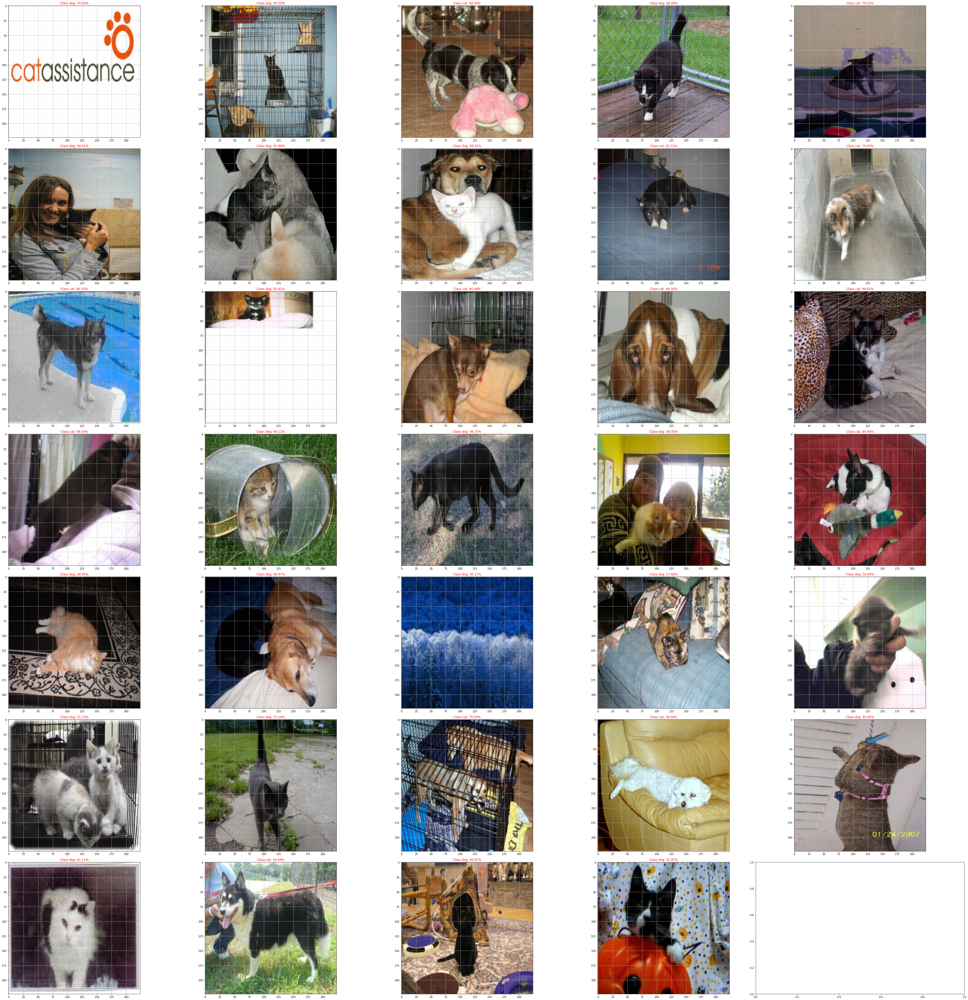

In [29]:
plot_misclassified_images(X_test, y_pred, y_test, label_names)